<!-- Markdown cell content starts -->
<!DOCTYPE html>
<html>
<head>
<style>
  body {
    background: #0f172a;
    color: #e5e7eb;
    font-family: Inter, sans-serif;
  }
  .assignment {
    max-width: 900px;
    margin: auto;
    padding: 20px;
    background: #1f2937;
    border-radius: 12px;
    border: 1px solid #374151;
  }
  h1 {
    color: #22d3ee;
  }
  h2 {
    border-left: 4px solid #22d3ee;
    padding-left: 8px;
  }
  table {
    width: 100%;
    border-collapse: collapse;
    margin-top: 12px;
  }
  th, td {
    border: 1px solid #374151;
    padding: 8px;
    text-align: left;
  }
  th {
    background: #111827;
  }
</style>
</head>
<body>
<div class="assignment">
  <h1>Computer Vision Assignment</h1>
  <p><strong>Course:</strong> Computer Vision<br>
     <strong>Deadline:</strong> XXXX<br>
     <strong>Total Points:</strong> 100</p>
     <strong>Kasra Kashani,</strong> 810101490<br>
     <strong>Alborz Mahmoudian,</strong> 810101514</p>

  <h2>Objective</h2>
  <ol>
    <li>Use pretrained CNNs for classification, detection, segmentation</li>
    <li>Perform preprocessing</li>
    <li>Run inference on input images</li>
    <li>Evaluate results</li>
  </ol>

  <h2>Grading Breakdown</h2>
  <table>
    <tr><th>Criterion</th><th>Description</th><th>Points</th></tr>
    <tr><td>Correct preprocessing</td><td>Resizing, normalization, tensor conversion</td><td>20</td></tr>
    <tr><td>Correct model usage</td><td>Proper pretrained model inference</td><td>20</td></tr>
    <tr><td>Visualization quality</td><td>Clear side-by-side figures</td><td>20</td></tr>
    <tr><td>Analysis and discussion</td><td>Interpretation and insights</td><td>40</td></tr>
    <tr><td colspan="2"><strong>Total</strong></td><td><strong>100</strong></td></tr>
  </table>

  <h4>Answer all questions colored in red, or complete all parts in "#TO DO" sections.</h4>

</div>
</body>
</html>
<!-- Markdown cell content ends -->


## 0. Setup and Installation

In [ ]:
!pip install -q torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install -q timm segment-anything ultralytics
!pip install -q pillow matplotlib

^C


# Import Required Libraries

In [46]:
import os
import cv2
import timm
import torch
import glob
import requests
import torchvision
import numpy as np
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torchvision.transforms as T
from typing import Tuple
from ultralytics import YOLO
from torchvision import transforms
from PIL import Image, ImageFilter, ImageOps
from torchvision.models.segmentation import deeplabv3_resnet50, DeepLabV3_ResNet50_Weights
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


## 1. Show All Input Images
<span style="color:red">
Plot all the images in a single figure.
</span>

In [20]:
images_dir = "images"
images_paths = sorted(glob.glob(os.path.join(images_dir, "*")))

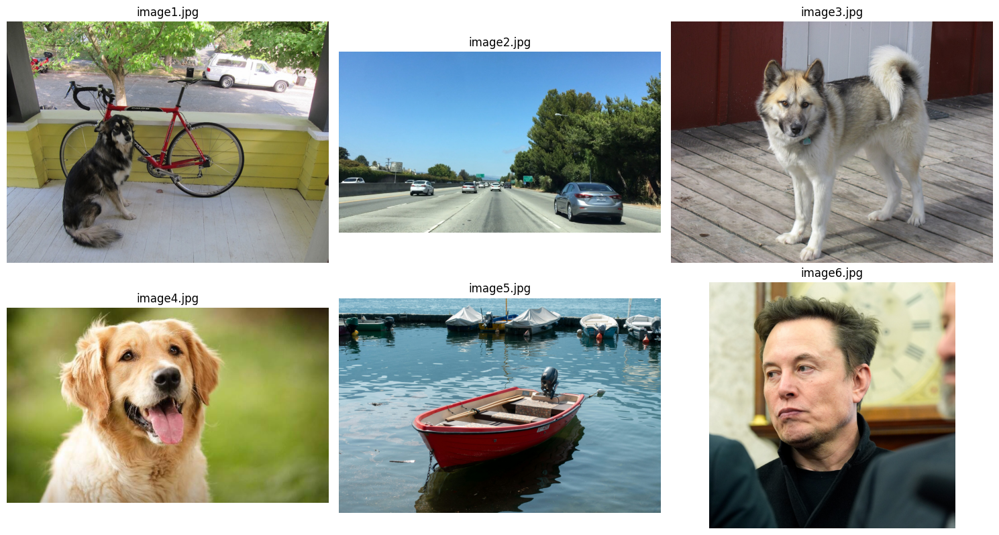

In [ ]:
fig, axes = plt.subplots(2, 3, figsize=(15, 8))

for ax, img_path in zip(axes.flatten(), images_paths):
    img = Image.open(img_path).convert("RGB")
    
    ax.imshow(img)
    ax.set_title(os.path.basename(img_path))
    ax.axis("off")

plt.tight_layout()
plt.show()

---
## 2. Task 1 – Image Classification
---
In this task, you are to use pretrained **EfficientNet-B4** model from torchvision/timm with 1000 classes. 

<span style="color:red">
Explain the functionality of the model briefly and indicate the dataset it is trained on.
</span>

<span style="color:green">
<br>
EfficientNet-B4 is part of the EfficientNet family, a group of convolutional neural networks designed using compound scaling.
<br>
Instead of arbitrarily increasing depth, width, or image resolution, EfficientNet scales all three dimensions simultaneously using a principled formula. This leads to models that achieve high accuracy with relatively few parameters compared to older architectures.
<br>
The pretrained EfficientNet-B4 model from timm is trained on ImageNet-1k, a large-scale dataset containing about 1.2–1.3 million training images, and also 1000 object categories (animals, tools, vehicles, everyday objects, etc.).
<br>
The model outputs a 1000-dimensional logit vector, where each element corresponds to one ImageNet class. Applying softmax converts these logits into class probabilities.
</span>

**Required preprocessing**:
You are asked to design and apply a **12‑step preprocessing pipeline** to prepare real‑world images for classification with EfficientNet‑B4. 

<span style="color:red"> For each step, briefly explain why it is useful.</span>


### Steps to include:
1. Convert to NumPy for OpenCV operations.
<span style="color:green">
<br>
Needed for OpenCV operations, which expect NumPy arrays rather than PIL images.
</span>

2. Apply Gaussian blur.
<span style="color:green">
<br>
Reduces sensor noise and small high-frequency artifacts. Makes later sharpening more effective.
</span>

3. Perform unsharp masking – Enhance edges and improve clarity.
<span style="color:green">
<br>
Enhances edges by subtracting a blurred version of the image. Produces cleaner, more defined structures.
</span>

4. Apply CLAHE (Contrast Limited Adaptive Histogram Equalization) – Improve local contrast.
<span style="color:green">
<br>
Improves local contrast while preventing over-amplification of noise. Helps reveal details in bright or dark regions.
</span>

5. Convert back to PIL format.
<span style="color:green">
<br>
Many torchvision transformations work on PIL images. Converting back allows easy augmentation steps.
</span>

6. Pad to square shape – Preserve aspect ratio before resizing.
<span style="color:green">
<br>
Preserves the original aspect ratio while creating a square canvas. Prevents geometric distortion before resizing.
</span>

7. Resize with high‑quality antialiasing.
<span style="color:green">
<br>
Resizes to EfficientNet-B4’s expected input size (380×380) using LANCZOS filtering to minimize aliasing artifacts.
</span>

8. Apply random rotation and random crop.
<span style="color:green">
<br>
Adds geometric variation. Makes the model more robust to camera angle changes and small object shifts. Data augmentation.
</span>

9. Apply color jitter and random grayscale.
<span style="color:green">
<br>
Adds photometric variation (brightness, contrast, color). Reduces sensitivity to lighting and color changes. Photometric augmentation.
</span>

10. Convert to tensor.
<span style="color:green">
<br>
Converts the image into the C×H×W format that PyTorch models require.
</span>

11. Normalize with ImageNet mean and std.
<span style="color:green">
<br>
Matches the distribution used during EfficientNet’s training on ImageNet. Essential for correct inference.
</span>

12. Add batch dimension.
<span style="color:green">
<br>
Converts a single image into a batch of size 1 (1×3×H×W), which is the format expected by the network.
</span>

In [ ]:
# Load model once
class_model = timm.create_model("efficientnet_b4", pretrained=True)

class_model.eval().to(device)

d:\python\Lib\site-packages\huggingface_hub\file_download.py:121: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\user\.cache\huggingface\hub\models--timm--efficientnet_b4.ra2_in1k. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


EfficientNet(
  (conv_stem): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
  (bn1): BatchNormAct2d(
    48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
    (drop): Identity()
    (act): SiLU(inplace=True)
  )
  (blocks): Sequential(
    (0): Sequential(
      (0): DepthwiseSeparableConv(
        (conv_dw): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
        (bn1): BatchNormAct2d(
          48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
          (drop): Identity()
          (act): SiLU(inplace=True)
        )
        (aa): Identity()
        (se): SqueezeExcite(
          (conv_reduce): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
          (act1): SiLU(inplace=True)
          (conv_expand): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
          (gate): Sigmoid()
        )
        (conv_pw): Conv2d(48, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (b

In [22]:
# ImageNet labels
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = requests.get(url).text.strip().split("\n")

In [ ]:
# Preprocessing
def preprocessing(img):
    """
    12-step preprocessing.
    Returns: tensor ready for EfficientNet-B4
    """
    # 1. Convert to NumPy for OpenCV operations
    img_np = np.array(img)

    # 2. Apply Gaussian blur
    blurred = cv2.GaussianBlur(img_np, (5, 5), 0)
    
    # 3. Perform unsharp masking
    sharpened = cv2.addWeighted(img_np, 1.5, blurred, -0.5, 0)
    
    # 4. Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
    lab = cv2.cvtColor(sharpened, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)
    lab_clahe = cv2.merge((l_clahe, a, b))
    img_clahe = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)
    
    # 5. Convert back to PIL format
    img_pil = Image.fromarray(img_clahe)
    
    # 6. Pad to square shape
    w, h = img_pil.size
    max_side = max(w, h)
    padded = Image.new("RGB", (max_side, max_side), (0, 0, 0))
    left = (max_side - w) // 2
    top = (max_side - h) // 2
    padded.paste(img_pil, (left, top))
    
    # 7. Resize with high-quality antialiasing
    target_size = 380
    resized = padded.resize((target_size, target_size), Image.Resampling.LANCZOS)
    
    # 8. Apply random rotation and random crop
    aug_transform_geo = transforms.Compose([
        transforms.RandomRotation(degrees=15, expand=True),
        transforms.RandomResizedCrop(size=target_size, scale=(0.9, 1.0))
    ])
    augmented_geo = aug_transform_geo(resized)
    
    # 9. Apply color jitter and random grayscale
    aug_transform_color = transforms.Compose([
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.RandomGrayscale(p=0.1)
    ])
    augmented = aug_transform_color(augmented_geo)
    
    # 10. Convert to tensor
    tensor = transforms.ToTensor()(augmented)

    # 11. Advanced normalization: subtract mean and divide by std per channel
    tensor = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                  std=[0.229, 0.224, 0.225])(tensor)

    # 12. Add batch dimension
    return tensor.unsqueeze(0).to(device), augmented

In [ ]:
# Classify
def classify(img, topk=5):
    """
    First preprocess the input image, then feed it to the network
    """
    # Preprocess
    preprocessed_image, preview_image = preprocessing(img)

    # Forward pass
    with torch.no_grad():
        output = class_model(preprocessed_image)
    
    # Probabilities
    probs = F.softmax(output[0], dim=0)
    top_prob, top_idx = torch.topk(probs, topk)
    top_prob = top_prob.cpu().numpy()
    top_idx = top_idx.cpu().numpy()

    tensor_img = preprocessed_image.squeeze().cpu()

    # If tensor is normalized, undo normalization (example for ImageNet mean/std)
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    tensor_img = tensor_img * std[:, None, None] + mean[:, None, None]

    # Convert to numpy and transpose to HWC
    tensor_img = tensor_img.numpy().transpose(1, 2, 0)

    # Plot both original and preprocessed tensor
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

    ax1.imshow(img)
    ax1.set_title("Input Image")
    ax1.axis("off")

    ax2.imshow(preview_image)
    ax2.set_title("Preprocessed Image")
    ax2.axis("off")
    
    plt.show()

    # Print top-k prediction result for the preprocessed image
    print(f"Top-{topk} predictions:")
    for p, idx in zip(top_prob, top_idx):
        print(f"{imagenet_classes[idx]:30s} : {p*100:.2f}%")
    print("-" * 40, "\n")

=== Image 3 ===


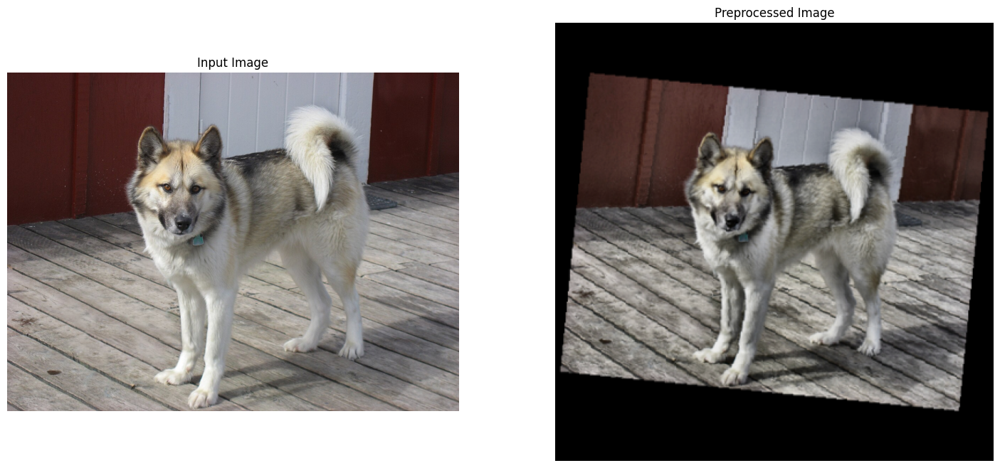

Top-5 predictions:
malamute                       : 46.70%
Eskimo dog                     : 5.45%
Norwegian elkhound             : 5.07%
Siberian husky                 : 2.08%
German shepherd                : 1.62%
---------------------------------------- 

=== Image 4 ===


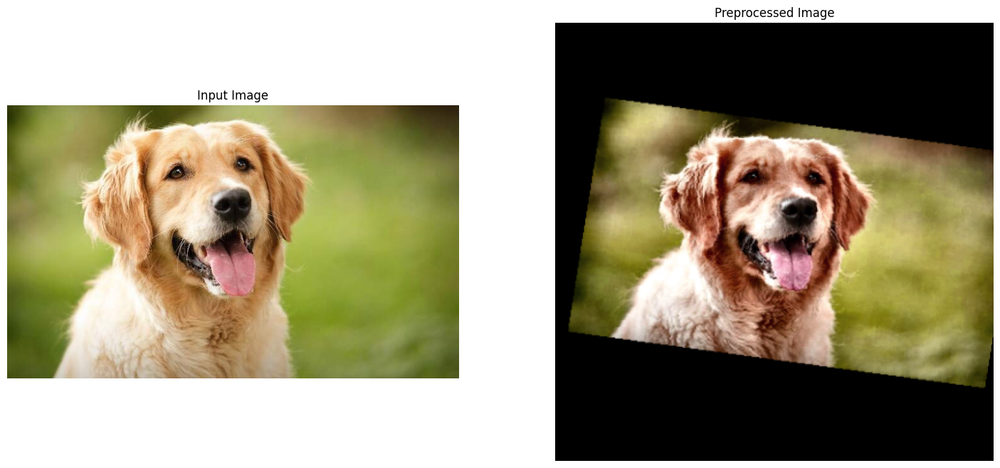

Top-5 predictions:
golden retriever               : 45.52%
Brittany spaniel               : 2.19%
Labrador retriever             : 1.26%
kuvasz                         : 0.72%
tennis ball                    : 0.67%
---------------------------------------- 

=== Image 5 ===


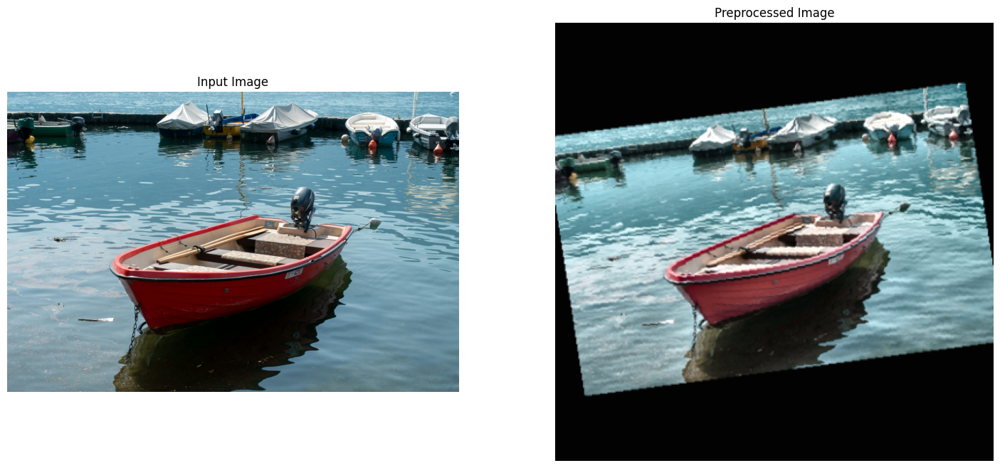

Top-5 predictions:
paddle                         : 12.88%
canoe                          : 9.77%
lakeside                       : 5.18%
speedboat                      : 4.84%
boathouse                      : 3.04%
---------------------------------------- 

=== Image 6 ===


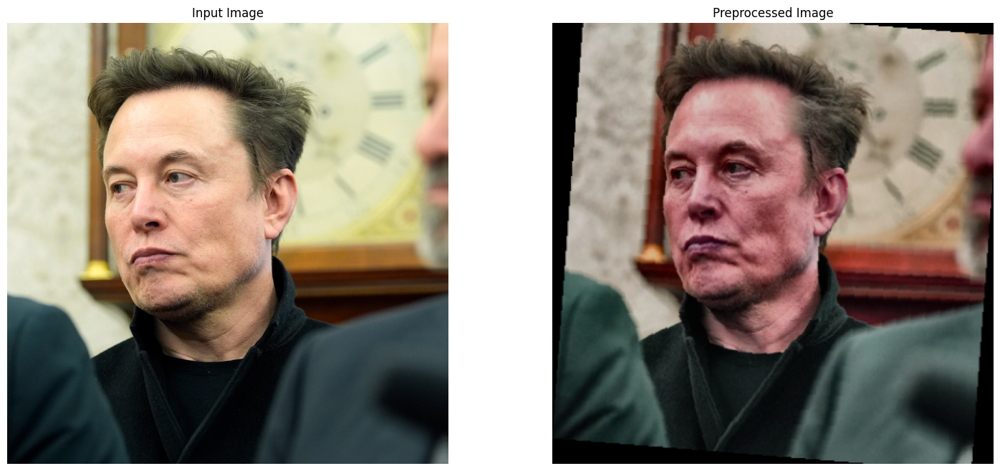

Top-5 predictions:
analog clock                   : 21.44%
wall clock                     : 16.33%
barometer                      : 3.80%
stopwatch                      : 3.59%
banjo                          : 2.41%
---------------------------------------- 



ERROR: Could not install packages due to an OSError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\user\\AppData\\Local\\Temp\\pip-unpack-x7zilzbg\\torch-2.7.1+cu118-cp313-cp313-win_amd64.whl'
Consider using the `--user` option or check the permissions.



In [30]:
# Evaluate the model one Image3, Image4, Image5, and Image6
for i in range(3, 7):
    img_path = os.path.join(images_dir, f"image{i}.jpg")
    img = Image.open(img_path).convert("RGB")

    print(f"=== Image {i} ===")
    
    classify(img, topk=5)

<span style="color:red">
Analysis of the classification results:
</span>

<span style="color:green">
<br>
=== Classification of dog images (Image 3 and Image 4) ===
<br>
EfficientNet produced highly confident predictions for both dog images.
For Image 3, the model placed Alaskan malamute, Eskimo dog, and Husky-like breeds at the top of the list. These classes share highly similar visual features such as thick fur, curled tails, and wolf-like facial structure.
<br>
For Image 4, the model predicted golden retriever with a dominant probability, which is consistent with the actual content of the image.
<br>
The model performs very well on common dog breeds, because ImageNet contains many dog classes and has strong representation of typical breed features. These results reflect the strong generalization ability of EfficientNet on natural animal photographs.
<br>

<br>
=== Classification of the boat image (Image 5) ===
<br>
The model’s predictions for the boat image were less precise. 
<br>
Although the image clearly contains a small red boat, the top predictions included paddle, canoe, lakeside, and boathouse.
<br>
These results highlight two common issues:
<br>
1- Scene-object confusion -> The model mixes contextual cues (water, dock, shoreline) with object cues. ImageNet often associates boats with nearby objects like paddles or lakes, so the network sometimes prioritizes the scene over the main object.
<br>
2- Fine-grained misclassification -> ImageNet has many similar boat-related classes, and their boundaries are vague. The model recognizes the general category but struggles to select the exact subclass.
<br>
The predictions are still semantically reasonable, even if not perfectly accurate.
<br>

<br>
=== Classification of a person image (Image 6) -> Failure case ===
<br>
The sixth image contains a person, but the model predicted analog clock, wall clock, and barometer as the top classes.
<br>
This is a clear failure case and reveals several insights. The model's attention is dominated by the large clock in the background, which occupies a large portion of the scene and has strong, easily identifiable circular features. Also ImageNet does not contain a specific class for this person, so the network chooses the most visually salient object rather than recognizing the human subject. And also preprocessing steps such as random rotation and color jitter may further emphasize background textures and reduce focus on the face.
<br>
This demonstrates a known limitation of classification models: they classify the entire image as a single object, not the most important object.
</span>

## 3. Task 2 – Object Detection
In this task, you are to use pretrained **R-CNN ResNet50-FPN-v2** model for object detection task.

<span style="color:red">
Explain the functionality of the model briefly and indicate the dataset it is trained on.
</span>

<span style="color:green">
<br>
Faster R-CNN with ResNet50-FPN-v2 is a two-stage object detector:
<br>
1- A ResNet-50 backbone + FPN (Feature Pyramid Network) which extracts multi-scale feature maps from the whole image.
<br>
2- A Region Proposal Network (RPN) which scans these features and proposes candidate object regions.
<br>
For each proposed region, a second head classifies the object (which category) and refines the bounding box coordinates.
<br>
The pretrained model used here is trained on the COCO dataset (Common Objects in Context), which contains everyday scenes with 80 object categories (person, car, dog, boat, etc.), with bounding-box annotations.
</span>

In [ ]:
# Load pretrained Faster R-CNN model
weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
det_model = fasterrcnn_resnet50_fpn_v2(weights=weights)

det_model.eval().to("cpu")

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to C:\Users\user/.cache\torch\hub\checkpoints\fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth


100%|██████████| 167M/167M [00:49<00:00, 3.56MB/s] 


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

In [37]:
# Preprocessing and transforms that match the weights
transform = weights.transforms()

# Category names (COCO classes)
categories = weights.meta["categories"]

In [ ]:
def frcnn_detect(img, score_thresh=0.5):
    """
    Run Faster R-CNN on a PIL image, draw boxes, labels and scores.
    """
    # Preprocess and transform PIL image to model input
    img_tensor = transform(img)
    inputs = [img_tensor]

    # Forward pass
    with torch.no_grad():
        outputs = det_model(inputs)

    output = outputs[0]
    boxes = output["boxes"]
    labels = output["labels"]
    scores = output["scores"]

    # Filter by confidence threshold
    keep = scores >= score_thresh
    boxes = boxes[keep].cpu()
    labels = labels[keep].cpu()
    scores = scores[keep].cpu()

    # Plot detections on the original image
    fig, ax = plt.subplots(1, 1, figsize=(18, 8))
    
    ax.imshow(img)
    ax.axis("off")

    for box, label, score in zip(boxes, labels, scores):
        x1, y1, x2, y2 = box.tolist()
        w, h = x2 - x1, y2 - y1

        # Draw rectangle
        rect = plt.Rectangle(
            (x1, y1), w, h,
            fill=False,
            linewidth=2,
        )
        ax.add_patch(rect)

        # Label text: class name + score
        class_name = categories[label]
        text = f"{class_name}: {score:.2f}"
        ax.text(
            x1,
            y1 - 5,
            text,
            fontsize=8,
            bbox=dict(facecolor="white", alpha=0.7, edgecolor="none"),
        )

    plt.show()

=== Image 1 ===


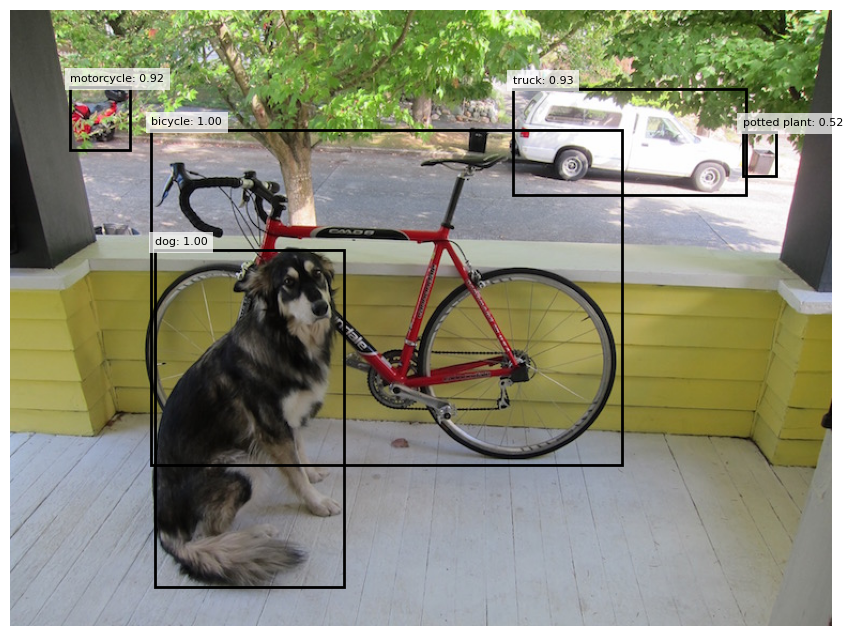

=== Image 2 ===


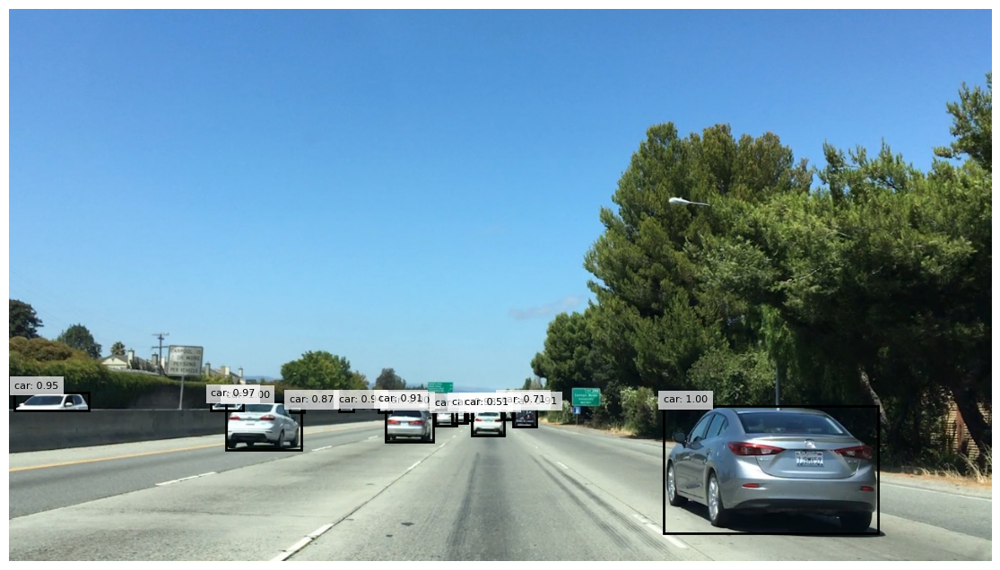

In [45]:
# Feed Image1 and Image2 to the model and evaluate it
for i in [1, 2]:
    img_path = os.path.join(images_dir, f"image{i}.jpg")
    img = Image.open(img_path).convert("RGB")

    print(f"=== Image {i} ===")
    
    frcnn_detect(img, score_thresh=0.5)

<span style="color:red">
Analysis of the detection results:
</span>

<span style="color:green">
<br>
=== Detection of dog + bicycle + street scene image (Image 1) ===
<br>
The detector successfully identified multiple objects in the scene, including dog, bicycle, motorcycle, truck, and even a potted plant in the background.
<br>
These detections match the COCO label set and demonstrate good generalization across varying object sizes.
<br>
The model confidently recognizes the dog and bicycle as the primary objects and still detects smaller distant objects with reasonable accuracy.
<br>
This shows the ability of Faster R-CNN to handle multi-object scenes, even when objects overlap or appear at different scales.
<br>

<br>
=== Detection of highway scene with multiple cars image (Image 2) ===
<br>
The model detects a large number of cars with high confidence.
<br>
This is expected because the COCO dataset contains many examples of cars in road scenes, enabling the detector to specialize well on this category.
<br>
However, the model does not detect trees, road signs, sky, or buildings because these are not annotated as COCO object categories and are treated as background.
<br>
The detector also ignores very small or distant objects whose confidence scores fall below the threshold, highlighting how detection accuracy drops at distance or low resolution.
</span>

## 4. Task 3 – Semantic Segmentation

In this task, you are to use the pretrained **DeepLabV3+ with ResNet50 backbone (torchvision)** model for a segemntation task.

<span style="color:red">
Explain the functionality of the model briefly and indicate the dataset it is trained on.
</span>

<span style="color:green">
<br>
DeepLabV3+ with a ResNet-50 backbone is a semantic segmentation network that predicts a class label for every pixel.
<br>
The ResNet-50 encoder extracts deep feature maps, and the DeepLab head uses atrous (dilated) convolutions and an Atrous Spatial Pyramid Pooling (ASPP) module to capture multi-scale contextual information.
<br>
In this assignment we use the COCO_WITH_VOC_LABELS_V1 weights from torchvision, which are trained on MS-COCO but mapped to the 21 PASCAL VOC classes (background + 20 object categories).
<br>
</span>

<span style="color:red">
<br>
Load the model using the "COCO_WITH_VOC_LABELS_V1" weights.

Do the required preprocessing.
</span>

In [47]:
# Load pretrained DeepLabV3 model
weights = DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1
seg_model = deeplabv3_resnet50(weights=weights)

seg_model.eval().to(device)

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to C:\Users\user/.cache\torch\hub\checkpoints\deeplabv3_resnet50_coco-cd0a2569.pth


100%|██████████| 161M/161M [04:10<00:00, 672kB/s]    


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [49]:
# Preprocessing and using ImageNet-style normalization consistent with the weights
seg_preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

In [50]:
# PASCAL VOC colors (21 classes)
VOC_COLORS = np.array([
    [0, 0, 0],      # background
    [128, 0, 0],    # aeroplane
    [0, 128, 0],    # bicycle
    [128, 128, 0],  # bird
    [0, 0, 128],    # boat
    [128, 0, 128],  # bottle
    [0, 128, 128],  # bus
    [128, 128, 128],# car
    [64, 0, 0],     # cat
    [192, 0, 0],    # chair
    [64, 128, 0],   # cow
    [192, 128, 0],  # dining table
    [64, 0, 128],   # dog
    [192, 0, 128],  # horse
    [64, 128, 128], # motorbike
    [192, 128, 128],# person
    [0, 64, 0],     # potted plant
    [128, 64, 0],   # sheep
    [0, 192, 0],    # sofa
    [128, 192, 0],  # train
    [0, 192, 128]   # tv/monitor
])

In [54]:
def segment_image(img):
    """
    Run DeepLabV3 on a PIL image with a colored mask using the VOC palette and an overlay image consisting of 60% of the original image and 40% of the mask.
    """
    # Forward pass
    input_tensor = seg_preprocess(img).unsqueeze(0).to(device)
    with torch.no_grad():
        output = seg_model(input_tensor)["out"][0]
    pred = output.argmax(0).cpu().numpy()
    
    # Create colored mask using VOC palette
    color_mask = VOC_COLORS[pred]
    
    # Create overlay: 60% original image + 40% mask
    img_np = np.array(img).astype(np.float32) / 255.0
    mask_np = color_mask.astype(np.float32) / 255.0
    overlay = 0.6 * img_np + 0.4 * mask_np
    overlay = np.clip(overlay, 0.0, 1.0)
    
    # Plot the orginal image and preprocessed version
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 8))
    
    ax1.imshow(img)
    ax1.set_title("Input Image")
    ax1.axis("off")
    
    ax2.imshow(color_mask)
    ax2.set_title("VOC Color Mask")
    ax2.axis("off")

    ax3.imshow(overlay)
    ax3.set_title("Segmentation Overlay (60% original + 40% mask)")
    ax3.axis("off")
    
    plt.tight_layout()
    plt.show()
    
    return pred

=== Image 2 ===


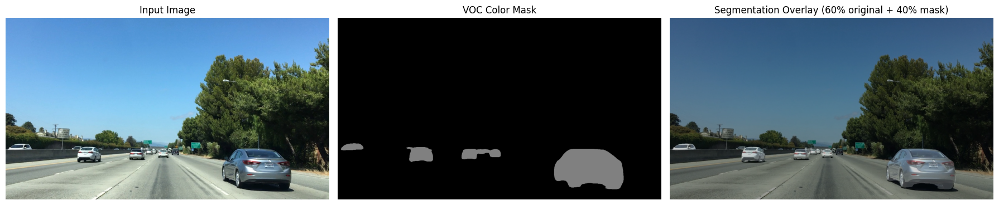

=== Image 3 ===


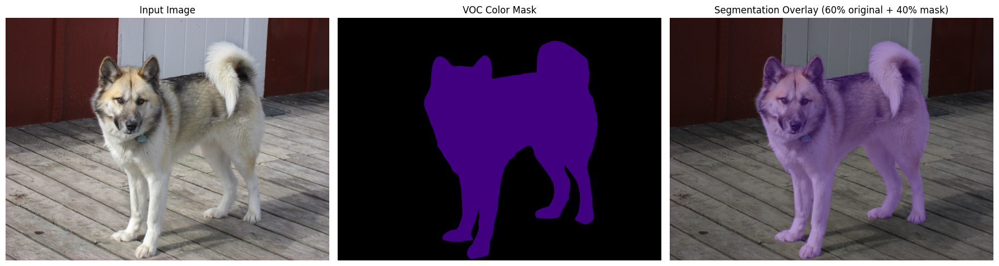

=== Image 6 ===


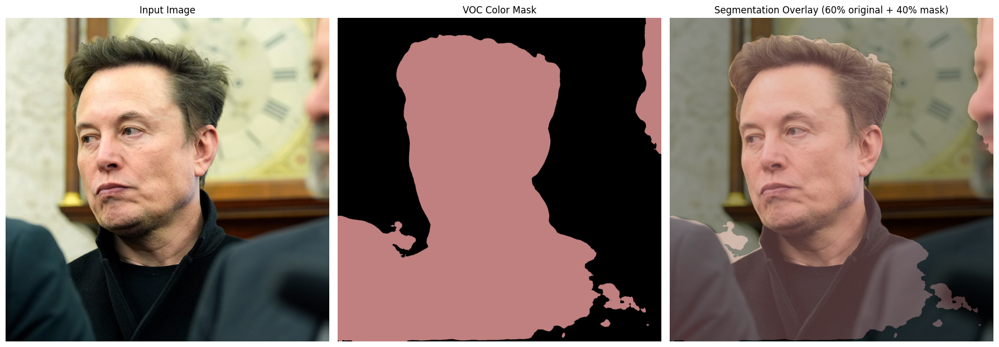

In [55]:
# Evaluate the model on Image2, Image3, and Image6
for i in [2, 3, 6]:
    img_path = os.path.join(images_dir, f"image{i}.jpg")
    img = Image.open(img_path).convert("RGB")

    print(f"=== Image {i} ===")

    pred = segment_image(img)

<span style="color:red">
Analysis of the segmentation results:
</span>

<span style="color:green">
<br>
=== Segmentation of highway scene image (Image 2) ===
<br>
The model detects only the cars on the road, leaving the sky, road, trees, and background as generic background regions.
<br>
This behavior is expected, because VOC segmentation includes classes such as car, person, bus, motorbike, etc., but does not include categories for road, sky, tree, or building surfaces.
<br>
As a result, the segmentation mask is very sparse, marking only the car silhouettes while the rest of the image remains black.
<br>
The overlay looks nearly identical to the original image except for subtle color changes on the detected cars.
<br>
This shows that VOC-trained segmentation cannot provide dense scene parsing in complex outdoor environments.
<br>

<br>
=== Segmentation of dog on wooden deck image (Image 3) ===
<br>
The model correctly identifies the dog region with a clean and continuous mask.
<br>
The segmentation boundaries follow the general shape of the animal, although the edges are slightly rough in the tail and paw areas.
<br>
Because VOC has a dedicated dog class, the model handles this image very well and produces a clear and interpretable overlay.
<br>
The strong performance here reflects the model’s training: animal classes such as dog and cat are well represented in VOC-style data.
<br>

<br>
=== Segmentation of person portrait image (Image 6) ===
<br>
The model identifies the person region but with noticeable issues:
<br>
1- The mask includes parts of the background, especially around the neck, jacket, and shoulder area.
<br>
2- Small artifacts appear in the bottom of the mask where the model confuses clothing with background or other people.
<br>
3- The segmentation boundary around the hair is crude, lacking fine detail.
<br>
These errors are typical for VOC-style segmentation, which struggles with complex clothing textures, overlapping people, fine boundaries like hair, and objects not belonging to any VOC class.
<br>
Still, the model successfully captures the main silhouette of the person.
</span>